In [1]:
import os
print(os.getcwd())

/workspaces/ecommerce/olist_dwh


In [2]:
import pandas as pd
from sqlalchemy import create_engine
import plotly.express as px
from urllib.parse import quote_plus 

# --- 1. Connect to the Database ---
# (This uses the same Codespace secrets we've been using all along)
user = os.environ.get('POSTGRES_USER')
password = os.environ.get('POSTGRES_PASSWORD')
host = 'localhost'
port = 5432
db_name = os.environ.get('POSTGRES_DB')

# --- ADDED: Safely encode the password for the connection string ---
password_encoded = quote_plus(password)

# Create the database connection engine
engine = create_engine(f'postgresql://{user}:{password_encoded}@{host}:{port}/{db_name}')

print("✅ Database connection successful.")

✅ Database connection successful.


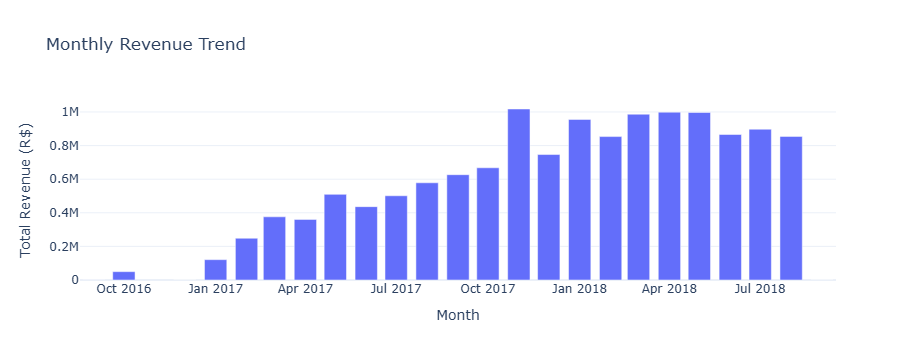

In [3]:
# --- Monthly Revenue Analysis ---

with open('analyses/sales_monthly_revenue.sql', 'r') as f:
    query = f.read().replace("{{ ref('fact_orders') }}", "analytics.fact_orders")

df = pd.read_sql_query(query, engine)

# Create the visualization
fig = px.bar(
    df,
    x='sales_month',
    y='monthly_revenue',
    title='Monthly Revenue Trend',
    labels={'sales_month': 'Month', 'monthly_revenue': 'Total Revenue (R$)'},
    template='plotly_white'
)
fig.show()

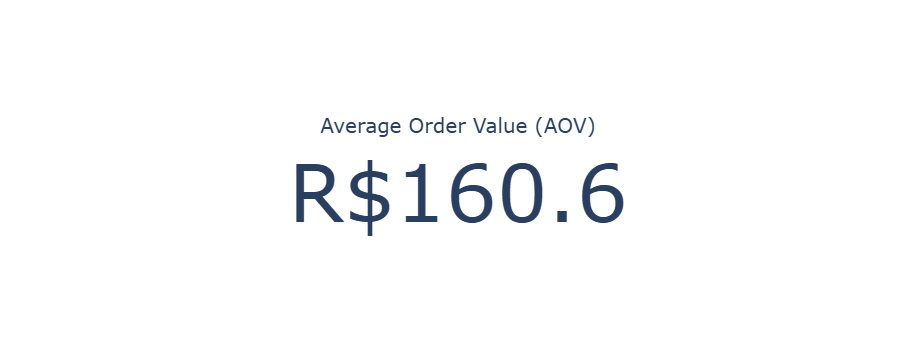

In [4]:
# --- Average Order Value (AOV) ---
import plotly.graph_objects as go

# Corrected: Read the SQL file AND replace the ref()
with open('analyses/kpi_aov.sql', 'r') as f:
    query = f.read().replace("{{ ref('fact_orders') }}", "analytics.fact_orders")

df = pd.read_sql_query(query, engine)
aov_value = df['average_order_value'].iloc[0]

fig = go.Figure(go.Indicator(
    mode = "number",
    value = aov_value,
    title = {"text": "Average Order Value (AOV)"},
    number = {'prefix': "R$"}
))
fig.show()

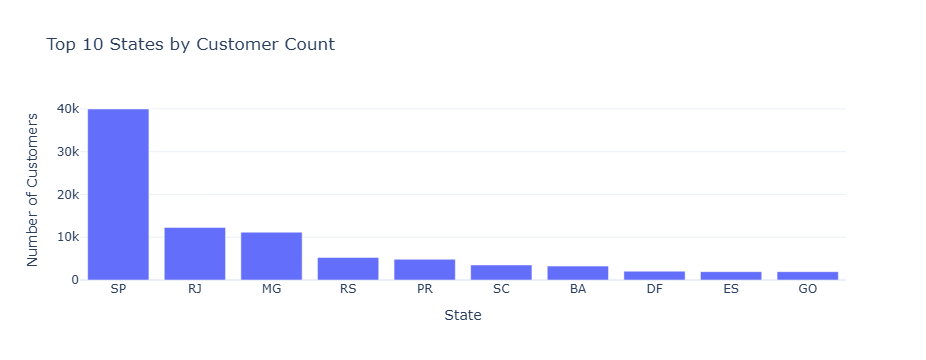

In [5]:
# --- Customer Distribution by State ---

# Corrected: Read the SQL file AND replace the ref()
with open('analyses/kpi_customer_distribution.sql', 'r') as f:
    query = f.read().replace("{{ ref('fact_orders') }}", "analytics.fact_orders")

df = pd.read_sql_query(query, engine)

fig = px.bar(
    df,
    x='state',
    y='number_of_customers',
    title='Top 10 States by Customer Count',
    labels={'state': 'State', 'number_of_customers': 'Number of Customers'},
    template='plotly_white'
)
fig.show()

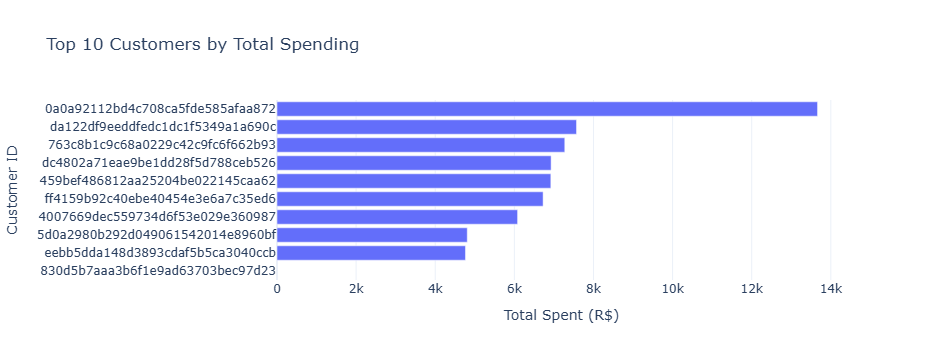

In [6]:
# --- Top 10 High-Value Customers ---

# Corrected: Read the SQL file AND replace the ref()
with open('analyses/cust_top_customers.sql', 'r') as f:
    query = f.read().replace("{{ ref('fact_orders') }}", "analytics.fact_orders")

df = pd.read_sql_query(query, engine)

fig = px.bar(
    df,
    y='customer_unique_id',
    x='total_spent',
    title='Top 10 Customers by Total Spending',
    labels={'customer_unique_id': 'Customer ID', 'total_spent': 'Total Spent (R$)'},
    template='plotly_white',
    orientation='h'
).update_yaxes(categoryorder="total ascending")
fig.show()

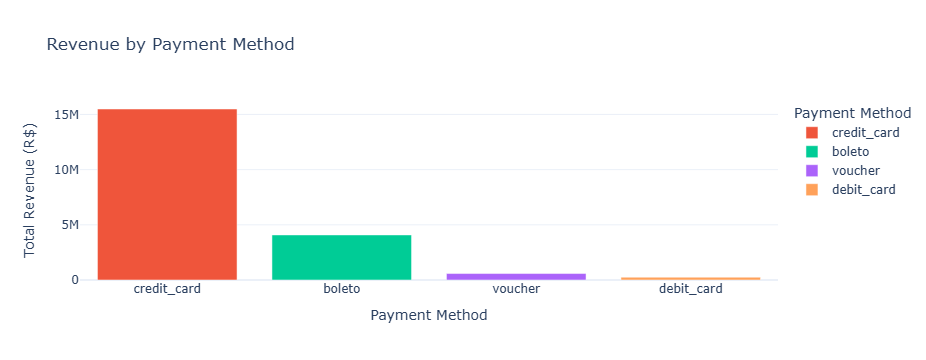

In [7]:
# --- Revenue by Payment Method ---

with open('analyses/sales_revenue_by_payment_method.sql', 'r') as f:
    query = f.read().replace("{{ ref('fact_orders') }}", "analytics.fact_orders")

df = pd.read_sql_query(query, engine)

fig = px.bar(
    df,
    x='primary_payment_type',
    y='total_revenue',
    color='primary_payment_type',
    title='Revenue by Payment Method',
    labels={'primary_payment_type': 'Payment Method', 'total_revenue': 'Total Revenue (R$)'},
    template='plotly_white'
)
fig.show()

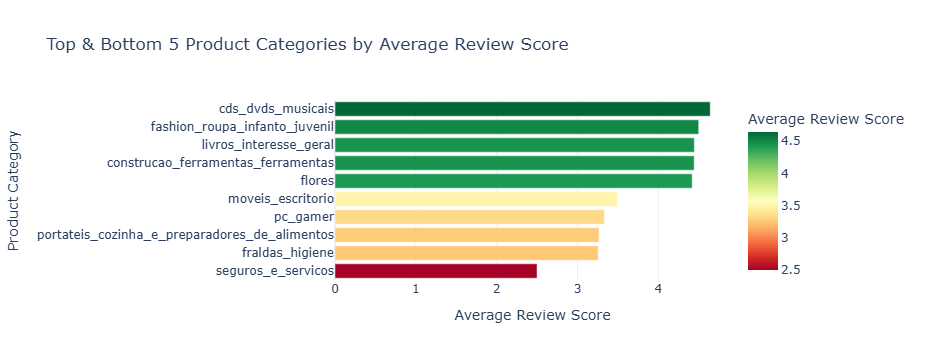

In [8]:
# --- Top & Bottom 5 Categories by Review Score ---

with open('analyses/cust_review_scores_by_category.sql', 'r') as f:
    query = f.read().replace("{{ ref('fact_orders') }}", "analytics.fact_orders")

df = pd.read_sql_query(query, engine)

fig = px.bar(
    df,
    x='average_review_score',
    y='product_category',
    color='average_review_score',
    color_continuous_scale='RdYlGn', # Red -> Yellow -> Green color scale
    title='Top & Bottom 5 Product Categories by Average Review Score',
    labels={'product_category': 'Product Category', 'average_review_score': 'Average Review Score'},
    template='plotly_white',
    orientation='h'
).update_yaxes(categoryorder="total ascending")
fig.show()

In [9]:
# --- EDA: Repeat Purchase Rate ---

# We only need the order_id and customer_unique_id for this analysis
query = "select order_id, customer_unique_id from analytics.fact_orders"
df_customers = pd.read_sql_query(query, engine)

# Count the number of orders per unique customer
customer_order_counts = df_customers.groupby('customer_unique_id')['order_id'].nunique().reset_index(name='order_count')

# Identify customers with more than one order
repeat_customers = customer_order_counts[customer_order_counts['order_count'] > 1].shape[0]
total_customers = customer_order_counts.shape[0]

# Calculate the repeat rate
repeat_rate = (repeat_customers / total_customers) * 100

print(f"Total Unique Customers: {total_customers}")
print(f"Customers with >1 Order: {repeat_customers}")
print(f"Repeat Purchase Rate: {repeat_rate:.2f}%")

Total Unique Customers: 95420
Customers with >1 Order: 2913
Repeat Purchase Rate: 3.05%


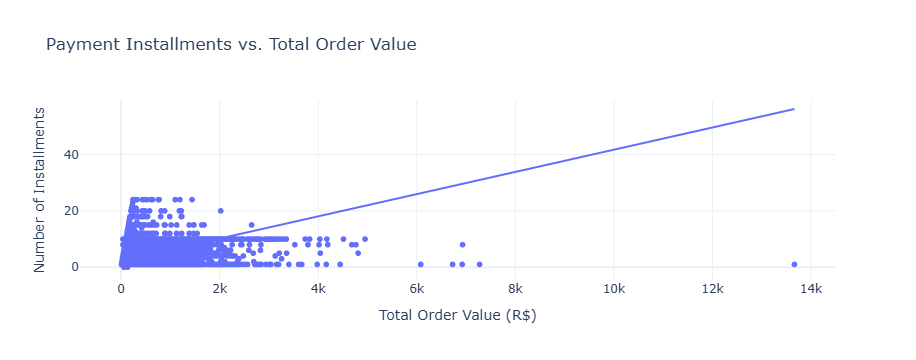

In [10]:
# --- EDA: Payment Installments vs. Order Value ---

# We only need distinct order information for this
query = "select distinct order_id, total_payment_value, max_payment_installments from analytics.fact_orders"
df_payments = pd.read_sql_query(query, engine)

fig = px.scatter(
    df_payments,
    x='total_payment_value',
    y='max_payment_installments',
    title='Payment Installments vs. Total Order Value',
    labels={'total_payment_value': 'Total Order Value (R$)', 'max_payment_installments': 'Number of Installments'},
    template='plotly_white',
    trendline='ols' # Add a trendline to see the correlation
)
fig.show()

# Phase 4 - Data Science and Machine Learning 🧠
## First Model - Review Score Classifier
### Step 1: Data Preparation

In [11]:
# --- 1. Load the Full Dataset ---
print("Loading data from fact_orders...")
query = "SELECT * FROM analytics.fact_orders"
df_model = pd.read_sql_query(query, engine)
print(f"Loaded {df_model.shape[0]} rows of data.")
print("-" * 30)


# --- 2. Handle Missing Values ---
# For our first model, we'll use a simple strategy: remove rows where
# the review score or delivery date is missing, as they are critical.
initial_rows = df_model.shape[0]
df_model.dropna(subset=['review_score', 'delivered_to_customer_at', 'days_to_delivery'], inplace=True)
print(f"Removed {initial_rows - df_model.shape[0]} rows with missing critical values.")
print(f"Remaining rows: {df_model.shape[0]}")
print("-" * 30)


# --- 3. Create the Target Variable ---
# We want to predict a binary outcome: was the review score low (1 or 2) or not?
# This creates a new column `is_low_score` with 1 for low scores and 0 for others.
df_model['is_low_score'] = (df_model['review_score'] <= 2).astype(int)
print("Created target variable 'is_low_score'.")
print("-" * 30)


# --- 4. Verify the Target Variable ---
# Let's see the distribution of our target.
print("Distribution of Low vs. High Review Scores:")
print(df_model['is_low_score'].value_counts(normalize=True))

# Display the first few rows of our prepared DataFrame
print("\nData is now ready for feature selection. Here's a preview:")
display(df_model.head())

Loading data from fact_orders...
Loaded 113314 rows of data.
------------------------------
Removed 3302 rows with missing critical values.
Remaining rows: 110012
------------------------------
Created target variable 'is_low_score'.
------------------------------
Distribution of Low vs. High Review Scores:
is_low_score
0    0.852034
1    0.147966
Name: proportion, dtype: float64

Data is now ready for feature selection. Here's a preview:


,order_item_id,order_id,seller_id,product_id,customer_id,customer_unique_id,purchased_at,order_status,delivered_to_customer_at,product_category,...,price,freight_value,total_payment_value,max_payment_installments,primary_payment_type,review_score,review_comment_message,days_to_delivery,is_late,is_low_score
0,1,00061f2a7bc09da83e415a52dc8a4af1,cc419e0650a3c5ba77189a1882b7556a,d63c1011f49d98b976c352955b1c4bea,c6fc061d86fab1e2b2eac259bac71a49,107e6259485efac66428a56f10801f4f,2018-03-24 22:16:10,delivered,2018-03-29 00:04:19,beleza_saude,...,59.99,8.88,68.87,3.0,credit_card,5.0,A caixa do produto veio com uma pequena avaria...,5.0,False,0
1,1,0009c9a17f916a706d71784483a5d643,fcb5ace8bcc92f75707dc0f01a27d269,3f27ac8e699df3d300ec4a5d8c5cf0b2,8a250edc40ebc5c3940ebc940f16a7eb,6062db572f3ef38b7a8ff4307abbfad3,2018-04-25 09:10:41,delivered,2018-04-30 17:54:25,consoles_games,...,639.00,11.34,650.34,6.0,credit_card,4.0,None,5.0,False,0
2,1,000e906b789b55f64edcb1f84030f90d,ea8482cd71df3c1969d7b9473ff13abc,57d79905de06d8897872c551bfd09358,6a3b2fc9f270df258605e22bef19fd88,3588484a539617d91500764822230fb6,2017-11-21 18:54:23,delivered,2017-12-09 17:27:23,telefonia,...,21.99,11.85,33.84,3.0,credit_card,3.0,None,18.0,True,0
3,1,000f25f4d72195062c040b12dce9a18a,7c67e1448b00f6e969d365cea6b010ab,1c05e0964302b6cf68ca0d15f326c6ba,86ade8ebc14f18dd6c3ea75bd0eb7534,1a6cbc34ea404cb0af7ed74df0999354,2018-03-07 10:33:13,delivered,2018-03-22 16:51:52,moveis_escritorio,...,119.99,44.40,164.39,1.0,credit_card,4.0,None,15.0,False,0
4,1,0014ae671de39511f7575066200733b7,92eb0f42c21942b6552362b9b114707d,23365beed316535b4105bd800c46670e,41065d9dcea52218c3943d2eed072b97,8e5a8d9363eb6296154b65750c8702ca,2017-05-22 13:49:03,delivered,2017-06-07 13:52:52,telefonia,...,16.50,14.10,30.60,1.0,boleto,5.0,None,16.0,False,0


### Step 2: Feature Selection and Engineering

In [12]:
# --- 1. Define Features (X) and Target (y) ---

# Choose a set of numerical and categorical features
numerical_features = ['price', 'freight_value', 'days_to_delivery']
categorical_features = ['product_category', 'seller_state', 'is_late']
features = numerical_features + categorical_features

target = 'is_low_score'

# Create our feature matrix (X) and target vector (y)
X = df_model[features]
y = df_model[target]

print("Selected features:")
print(X.head())
print("-" * 30)


# --- 2. Handle Categorical Features with One-Hot Encoding ---

# Machine learning models only understand numbers. We need to convert
# our categorical text columns into a numerical format.
# One-hot encoding creates a new binary (0 or 1) column for each category.
X_encoded = pd.get_dummies(X, columns=categorical_features, drop_first=True)

print("Features after one-hot encoding:")
print(f"New shape of X: {X_encoded.shape}")
print("Note the new columns like 'product_category_...' and 'seller_state_...'\n")
display(X_encoded.head())

Selected features:
    price  freight_value  days_to_delivery   product_category seller_state  \
0   59.99           8.88               5.0       beleza_saude           SP   
1  639.00          11.34               5.0     consoles_games           SP   
2   21.99          11.85              18.0          telefonia           SP   
3  119.99          44.40              15.0  moveis_escritorio           SP   
4   16.50          14.10              16.0          telefonia           SP   

   is_late  
0    False  
1    False  
2     True  
3    False  
4    False  
------------------------------
Features after one-hot encoding:
New shape of X: (110012, 97)
Note the new columns like 'product_category_...' and 'seller_state_...'



,price,freight_value,days_to_delivery,product_category_alimentos,product_category_alimentos_bebidas,product_category_artes,product_category_artes_e_artesanato,product_category_artigos_de_festas,product_category_artigos_de_natal,product_category_audio,...,seller_state_PI,seller_state_PR,seller_state_RJ,seller_state_RN,seller_state_RO,seller_state_RS,seller_state_SC,seller_state_SE,seller_state_SP,is_late_True
0,59.99,8.88,5.0,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,False
1,639.00,11.34,5.0,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,False
2,21.99,11.85,18.0,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,True
3,119.99,44.40,15.0,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,False
4,16.50,14.10,16.0,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,False


### Step 3: Model Training

In [13]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler

# --- 1. Split Data into Training and Testing Sets ---

# We'll use 80% of the data to train the model and 20% to test its performance.
# `random_state` ensures that we get the same split every time we run the code.
X_train, X_test, y_train, y_test = train_test_split(
    X_encoded, y, test_size=0.2, random_state=42
)

# --- 2. Scale the Numerical Features ---
# Create a scaler object
scaler = StandardScaler()

# Fit the scaler ONLY on the training data and transform it
X_train[numerical_features] = scaler.fit_transform(X_train[numerical_features])

# Use the same fitted scaler to transform the test data
X_test[numerical_features] = scaler.transform(X_test[numerical_features])

print("✅ Numerical features scaled successfully.")
print("\nData split into training and testing sets:")
print(f"X_train shape: {X_train.shape}")
print(f"X_test shape: {X_test.shape}")
print("-" * 30)


# --- 3. Initialize and Train the Model ---

# We'll use a simple Logistic Regression model.
# `max_iter` is set to a higher value to ensure the model has enough time to find the best solution.
model = LogisticRegression(max_iter=1000)

# The .fit() method is where the model "learns" from the training data.
model.fit(X_train, y_train)

print("✅ Model training complete.")

✅ Numerical features scaled successfully.

Data split into training and testing sets:
X_train shape: (88009, 97)
X_test shape: (22003, 97)
------------------------------
✅ Model training complete.


In [14]:
from sklearn.metrics import classification_report, confusion_matrix

# --- 1. Make Predictions on the Test Set ---
# Use the trained model to predict outcomes for the test data
y_pred = model.predict(X_test)


# --- 2. Generate and Print the Classification Report ---
print("--- Classification Report ---")
# This report shows the main classification metrics
report = classification_report(y_test, y_pred, target_names=['High Score (0)', 'Low Score (1)'])
print(report)


# --- 3. Generate and Visualize the Confusion Matrix ---
print("--- Confusion Matrix ---")
# A confusion matrix shows the number of correct and incorrect predictions
cm = confusion_matrix(y_test, y_pred)

# Use Plotly to create a heatmap for a better visual
fig = px.imshow(
    cm,
    text_auto=True,
    labels=dict(x="Predicted Label", y="True Label"),
    x=['Predicted High Score', 'Predicted Low Score'],
    y=['Actual High Score', 'Actual Low Score'],
    title="Confusion Matrix",
    color_continuous_scale='Blues'
)
fig.show()

--- Classification Report ---
                precision    recall  f1-score   support

High Score (0)       0.88      0.98      0.93     18788
 Low Score (1)       0.66      0.22      0.33      3215

      accuracy                           0.87     22003
     macro avg       0.77      0.60      0.63     22003
  weighted avg       0.85      0.87      0.84     22003

--- Confusion Matrix ---


In [15]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import classification_report, roc_auc_score, precision_recall_curve, auc
import lightgbm as lgb

# --- 1. Define the Model and Parameter Grid ---

# Initialize a LightGBM Classifier. 'class_weight' tells it to penalize errors
# on the minority class (low scores) more heavily.
model = lgb.LGBMClassifier(class_weight='balanced', random_state=42)

# Define the range of hyperparameters to test
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1],
    'num_leaves': [20, 31, 40],
    'max_depth': [-1, 10, 20],
    'reg_alpha': [0.1, 0.5], # L1 regularization
    'reg_lambda': [0.1, 0.5] # L2 regularization
}

# --- 2. Set Up the Randomized Search ---

# RandomizedSearchCV will test 10 random combinations from the param_grid
# using 3-fold cross-validation. We tell it to optimize for 'recall'.
random_search = RandomizedSearchCV(
    estimator=model,
    param_distributions=param_grid,
    n_iter=10,
    scoring='recall', # Our primary goal is to find low scores (recall)
    cv=3,
    refit=True, # Refit the best model on the entire training set
    n_jobs=-1,  # Use all available CPU cores
    random_state=42,
    verbose=1
)

# --- 3. Run the Search ---
print("Starting hyperparameter tuning...")
random_search.fit(X_train, y_train)
print("\n✅ Hyperparameter tuning complete.")
print("-" * 30)

# --- 4. Display the Best Parameters ---
print("Best parameters found:")
print(random_search.best_params_)

# Store the best model found by the search
best_model = random_search.best_estimator_

Starting hyperparameter tuning...
Fitting 3 folds for each of 10 candidates, totalling 30 fits
[LightGBM] [Info] Number of positive: 8708, number of negative: 49964
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009813 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 758
[LightGBM] [Info] Number of data points in the train set: 58672, number of used features: 82
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Info] Number of positive: 8709, number of negative: 49964
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008432 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 760
[LightGBM] [Info] Nu

--- Tuned Model Classification Report ---
                precision    recall  f1-score   support

High Score (0)       0.91      0.85      0.88     18788
 Low Score (1)       0.36      0.49      0.42      3215

      accuracy                           0.80     22003
     macro avg       0.64      0.67      0.65     22003
  weighted avg       0.83      0.80      0.81     22003


--- Tuned Model Confusion Matrix ---


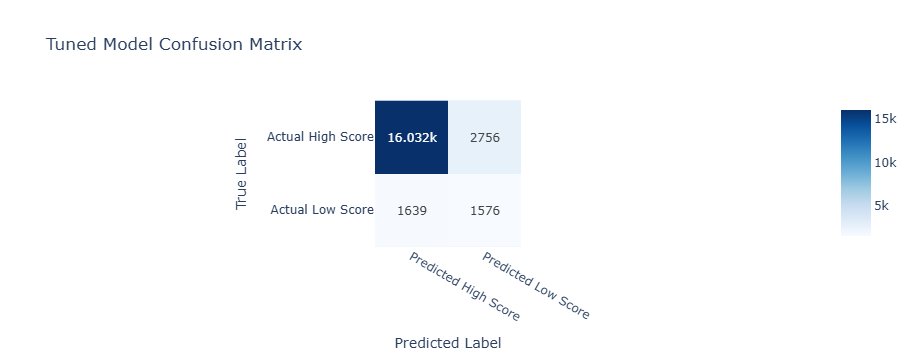


Precision-Recall AUC for the tuned model: 0.4291


In [16]:
# --- 1. Make Predictions with the Best Model ---
y_pred_tuned = best_model.predict(X_test)
y_pred_proba_tuned = best_model.predict_proba(X_test)[:, 1] # Get probabilities for the positive class

# --- 2. Display the New Classification Report ---
print("--- Tuned Model Classification Report ---")
report_tuned = classification_report(y_test, y_pred_tuned, target_names=['High Score (0)', 'Low Score (1)'])
print(report_tuned)


# --- 3. Visualize the New Confusion Matrix ---
print("\n--- Tuned Model Confusion Matrix ---")
cm_tuned = confusion_matrix(y_test, y_pred_tuned)

fig_tuned = px.imshow(
    cm_tuned,
    text_auto=True,
    labels=dict(x="Predicted Label", y="True Label"),
    x=['Predicted High Score', 'Predicted Low Score'],
    y=['Actual High Score', 'Actual Low Score'],
    title="Tuned Model Confusion Matrix",
    color_continuous_scale='Blues'
)
fig_tuned.show()


# --- 4. Calculate Precision-Recall AUC (a better metric for imbalanced data) ---
precision, recall, _ = precision_recall_curve(y_test, y_pred_proba_tuned)
pr_auc = auc(recall, precision)

print(f"\nPrecision-Recall AUC for the tuned model: {pr_auc:.4f}")